CHANGE ALL LABELS TO 0

In [ ]:
# shutil.make_archive('/content/siim-cov19', 'zip', '/content/covid/siim-cov19')

'/content/siim-cov19.zip'

In [ ]:
# from google.colab import files
# files.download("/content/covid/siim-cov19.yaml")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
REDUCED_SIZE = True
SUPERPIXEL = True
DEOLDIFY = True

# **IMPORTS**

In [ ]:
! pip install --upgrade albumentations

In [ ]:
import shutil 
import os
import random
import time
import albumentations as A
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from glob import glob

# ***Get Data from Kaggle***





In [ ]:
!rm -rf /content/covid

In [ ]:
 ! pip install -q kaggle

In [ ]:
# from google.colab import files
# files.upload()

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d farhanhaikhan/unet-lung-segmentation-weights-for-chest-x-rays

 92% 25.0M/27.3M [00:01<00:00, 13.7MB/s]
100% 27.3M/27.3M [00:01<00:00, 23.5MB/s]


In [ ]:
!unzip /content/unet-lung-segmentation-weights-for-chest-x-rays.zip

Archive:  /content/unet-lung-segmentation-weights-for-chest-x-rays.zip
  inflating: .gitignore              
  inflating: LICENSE                 
  inflating: README.md               
  inflating: cxr_reg_weights.best.hdf5  


In [ ]:
!kaggle datasets download -d deviprasad0027/siimscovid19-detection-chest-radiographs-512x512 --force

 47% 395M/843M [00:14<00:16, 28.2MB/s]
User cancelled operation


In [ ]:
import shutil 
import os

os.mkdir('/content/covid')
os.mkdir('/content/covid/labels/')
os.mkdir('/content/covid/images')
os.mkdir('/content/covid/superpixel_images')

In [ ]:
!cp /content/siimscovid19-detection-chest-radiographs-512x512.zip /content/covid

In [ ]:
!unzip /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip -d /content/covid

Archive:  /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip or
        /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip.zip, and cannot find /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip.ZIP, period.


In [ ]:
# !tar -xf /content/covid/test.tar.xz --directory /content/covid/images

In [ ]:
!tar -xf /content/covid/train.tar.xz --directory /content/covid/images

tar: /content/covid/train.tar.xz: Cannot open: No such file or directory
tar: Error is not recoverable: exiting now


In [ ]:
!cp -r /content/covid/images/train/. /content/covid/images

cp: cannot stat '/content/covid/images/train/.': No such file or directory


In [ ]:
!cp -r /content/covid/images/test/. /content/covid/images

cp: cannot stat '/content/covid/images/test/.': No such file or directory


In [ ]:
!rm -rf /content/covid/images/train

In [ ]:
!rm -rf /content/covid/images/test

In [ ]:
!cp /content/drive/MyDrive/Covid_final/meta.csv /content/covid

cp: cannot stat '/content/drive/MyDrive/Covid_final/meta.csv': No such file or directory


In [ ]:
!cp /content/drive/MyDrive/Covid_final/train_image_level.csv.zip /content/covid

cp: cannot stat '/content/drive/MyDrive/Covid_final/train_image_level.csv.zip': No such file or directory


In [ ]:
!unzip /content/covid/train_image_level.csv.zip -d /content/covid

unzip:  cannot find or open /content/covid/train_image_level.csv.zip, /content/covid/train_image_level.csv.zip.zip or /content/covid/train_image_level.csv.zip.ZIP.


In [ ]:
!cp /content/drive/MyDrive/Covid_final/train_study_level.csv /content/covid
!rm /content/covid/train_image_level.csv.zip

cp: cannot stat '/content/drive/MyDrive/Covid_final/train_study_level.csv': No such file or directory
rm: cannot remove '/content/covid/train_image_level.csv.zip': No such file or directory


In [ ]:
!cp /content/train_image_level.csv /content/covid
!cp /content/train_study_level.csv /content/covid

cp: cannot stat '/content/train_image_level.csv': No such file or directory
cp: cannot stat '/content/train_study_level.csv': No such file or directory


In [ ]:
!cp /content/drive/MyDrive/Covid_final/meta.csv /content/covid/

cp: cannot stat '/content/drive/MyDrive/Covid_final/meta.csv': No such file or directory


In [ ]:
# shutil.copytree('/content/train', '/content/covid/images/train')
# shutil.copytree('/content/test', '/content/covid/images/test')

In [ ]:
!rm -rf /content/covid/train.tar.xz
!rm -rf /content/covid/test.tar.xz
!rm -rf /content/covid/siimscovid19-detection-chest-radiographs-512x512.zip
!rm -rf /content/siimscovid19-detection-chest-radiographs-512x512.zip

# **Resizing with albumentations**

In [ ]:
IMG_SIZE = 512
LABEL_DIR = '/content/covid/labels/'
IMAGE_DIR = '/content/covid/images/'
COLORS = [(255,0,0), (0,255,0), (0,0,255), (255,255,0), (255,0,255)]

In [ ]:
! pip install --upgrade albumentations

In [ ]:
# for image augmentations
import albumentations as A
# from albumentations.pytorch.transforms import ToTensorV2

In [ ]:
def resize_image(img_arr, bboxes, h, w):
    """
    :param img_arr: original image as a numpy array
    :param bboxes: bboxes as numpy array where each row is 'x_min', 'y_min', 'x_max', 'y_max', "class_id"
    :param h: resized height dimension of image
    :param w: resized weight dimension of image
    :return: dictionary containing {image:transformed, bboxes:['x_min', 'y_min', 'x_max', 'y_max', "class_id"]}
    """

    # create resize transform pipeline
    transform = A.Compose(
        [A.Resize(height=h, width=w, always_apply=True)],
        bbox_params=A.BboxParams(format='pascal_voc'))

    transformed = transform(image=img_arr, bboxes=bboxes)

    return transformed

def resize_image_withbbox(image, bboxes, labels, height, width):
    
    for j in range(len(bboxes)):
        bboxes[j] = list(map(int, bboxes[j]))
        bboxes[j].append(int(labels[j]))

    transformed_dict = resize_image(image, bboxes, height, width)

    # contains the image as array
    transformed_arr = transformed_dict["image"]
    # contains the resized bounding boxes
    transformed_info = np.array(list(map(list, transformed_dict["bboxes"]))).astype(float)
    bboxes = []
    for j in range(len(transformed_info)):
        bboxes.append(list(transformed_info[j])[:-1])
    #     transformed_info[i] = transformed_info[i][:-1]
#     image['boxes'] = bboxes
#     image['img'] = transformed_arr
    return transformed_arr, bboxes

# images = load_images(1)

# plot_img(images[0]['img'], images[0]['boxes'])
# image = resize_image_withbbox(images[0], 224, 224)
# plot_img(image['img'], image['boxes'])

In [ ]:
def plot_img_bbox(img, bboxes):
    color = 'green'
    text_width, text_height = cv2.getTextSize(text, FONT, FONT_SCALE, FONT_THICKNESS)[0]
    temp = img
#     print(img)
    for box in bboxes:
        img = cv2.rectangle(
            img,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, THICKNESS
        )
        box_width = int(box[2]) - int(box[0])
        img = cv2.putText(img, text, (int(box[0])-(text_width-box_width)//2, int(box[1])-10),
                        FONT, FONT_SCALE, color, FONT_THICKNESS, FONT_LINE_TYPE)          
# #         img = cv2.resize(img, (500, 500))

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def plot_bbox(image_path, boxes, labels):

    if isinstance(image_path, str):
        image = cv2.imread(image_path)
    else:
        image = image_path
    for i in range(len(boxes)):
        xc, yc, w, h = boxes[i]

        x1 = xc - int(np.round(w/2))
        y1 = yc - int(np.round(h/2))
        x2 = xc + int(np.round(w/2))
        y2 = yc + int(np.round(h/2))

        x1 = int(float(x1))
        y1 = int(float(y1))
        x2 = int(float(x2))
        y2 = int(float(y2))


        # x = int(float(x)*dw)
        # y = int(float(y)*dh)
        # w = int(float(w)*dw)
        # h = int(float(h)*dh)
        # print(x1,y1,x2,y2)
        # draw a bounding box rectangle and label on the image
        color_id = labels[i]
        color = COLORS[color_id]
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        print((x1, y1), (x2, y2))
        image = cv2.rectangle(image, (x1, y1), (x2, y2), (255,0,0), 2)
        
        # text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])

        # cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,0.5, color, 2)
    

    plt.imshow(image)
    return image

# ***Getting New Bboxes***

In [ ]:
# print(len(os.listdir('/content/drive/MyDrive/Covid_final/Lung_SD')))

12208


In [ ]:
print(len(os.listdir('/content/drive/MyDrive/Covid_final/labels')))

12208


In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/Covid_final/deoldify_sp_df.csv')
# del df['Unnamed: 0.1']
# del df['boxes']
# del df['label']
# del df['StudyInstanceUID'] 
# del df['path'] 
# del df['image_level']
# del df['StudyInstanceUID_count'] 
# del df['dim0'] 
# del df['dim1']

,Unnamed: 0,id,study_label


In [ ]:
import pandas as pd
df = pd.read_csv('/content/covid/train_image_level.csv')
study_df = pd.read_csv('/content/covid/train_study_level.csv')

In [ ]:
# Modify values in the id column
df['id'] = df.apply(lambda row: row.id.split('_')[0], axis=1)
# Add absolute path
df['path'] = df.apply(lambda row: '/content/covid/images/'+row.id+'.png' , axis=1)
# Get image level labels
df['image_level'] = df.apply(lambda row: row.label.split(' ')[0], axis=1)

print(df.columns)
df.head()

Index(['id', 'boxes', 'label', 'StudyInstanceUID', 'path', 'image_level'], dtype='object')


,id,boxes,label,StudyInstanceUID,path,image_level
0,000a312787f2,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,/content/covid/images/000a312787f2.png,opacity
1,000c3a3f293f,NaN,none 1 0 0 1 1,ff0879eb20ed,/content/covid/images/000c3a3f293f.png,none
2,0012ff7358bc,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,/content/covid/images/0012ff7358bc.png,opacity
3,001398f4ff4f,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,/content/covid/images/001398f4ff4f.png,opacity
4,001bd15d1891,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,/content/covid/images/001bd15d1891.png,opacity


In [ ]:
study_df['study_label'] = 3
study_df.loc[study_df['Typical Appearance'] == 1, 'study_label'] = 0
study_df.loc[study_df['Indeterminate Appearance'] == 1, 'study_label'] = 1
study_df.loc[study_df['Atypical Appearance'] == 1, 'study_label'] = 2
study_df.head(5)

,id,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,study_label
0,00086460a852_study,0,1,0,0,0
1,000c9c05fd14_study,0,0,0,1,2
2,00292f8c37bd_study,1,0,0,0,3
3,005057b3f880_study,1,0,0,0,3
4,0051d9b12e72_study,0,0,0,1,2


In [ ]:
study_df['StudyInstanceUID'] = study_df['id'].apply(lambda id: id.replace('_study', ""))
del study_df['id']
study_df.head()

,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,study_label,StudyInstanceUID
0,0,1,0,0,0,00086460a852
1,0,0,0,1,2,000c9c05fd14
2,1,0,0,0,3,00292f8c37bd
3,1,0,0,0,3,005057b3f880
4,0,0,0,1,2,0051d9b12e72


In [ ]:
df.head()

,id,boxes,label,StudyInstanceUID,path,image_level
0,000a312787f2,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,/content/covid/images/000a312787f2.png,opacity
1,000c3a3f293f,NaN,none 1 0 0 1 1,ff0879eb20ed,/content/covid/images/000c3a3f293f.png,none
2,0012ff7358bc,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,/content/covid/images/0012ff7358bc.png,opacity
3,001398f4ff4f,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,/content/covid/images/001398f4ff4f.png,opacity
4,001bd15d1891,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,/content/covid/images/001bd15d1891.png,opacity


In [ ]:
df = pd.merge(df, study_df, how = 'left', on = 'StudyInstanceUID')
del df['Negative for Pneumonia']
del df['Typical Appearance']
del df['Indeterminate Appearance']
del df['Atypical Appearance']
df.head()

,id,boxes,label,StudyInstanceUID,path,image_level,study_label
0,000a312787f2,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,/content/covid/images/000a312787f2.png,opacity,0
1,000c3a3f293f,NaN,none 1 0 0 1 1,ff0879eb20ed,/content/covid/images/000c3a3f293f.png,none,3
2,0012ff7358bc,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,/content/covid/images/0012ff7358bc.png,opacity,0
3,001398f4ff4f,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,/content/covid/images/001398f4ff4f.png,opacity,2
4,001bd15d1891,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,/content/covid/images/001bd15d1891.png,opacity,0


In [ ]:
## Remove invalid data

group_col = 'StudyInstanceUID'
count_df=pd.DataFrame(df.groupby(group_col)['id'].count())
count_df.columns = [f'{group_col}_count']
df=df.merge(count_df.reset_index(), on=group_col)
df.head(2)

one_study_multi_image_df = df[df[f'{group_col}_count'] > 1]

print(len(one_study_multi_image_df))

512


In [ ]:
# Load meta.csv file
# Original dimensions are required to scale the bounding box coordinates appropriately.
meta_df = pd.read_csv('/content/covid/meta.csv')
meta_df = meta_df.drop('split', axis=1)
meta_df.columns = ['id', 'dim0', 'dim1']

meta_df.head(2)

,id,dim0,dim1
0,a29c5a68b07b,2320,2828
1,9850b5470fd6,2330,2382


In [ ]:
# Merge both the dataframes
df = df.merge(meta_df, on='id',how="left")
df['boxes'][0]
# print(len(df))

"[{'x': 789.28836, 'y': 582.43035, 'width': 1026.65662, 'height': 1917.30292}, {'x': 2245.91208, 'y': 591.20528, 'width': 1094.66162, 'height': 1761.54944}]"

In [ ]:
import numpy as np 

# Get the raw bounding box by parsing the row value of the label column.
# Ref: https://www.kaggle.com/yujiariyasu/plot-3positive-classes
def get_bbox(row):
    bboxes = []
    bbox = []
    for i, l in enumerate(row.label.split(' ')):
        if (i % 6 == 0) | (i % 6 == 1):
            continue
        bbox.append(float(l))
        if i % 6 == 5:
            bboxes.append(bbox)
            bbox = []  
            
    return bboxes

# Scale the bounding boxes according to the size of the resized image. 
def scale_bbox(row, bboxes):
    # Get scaling factor
    scale_x = IMG_SIZE/row.dim1
    scale_y = IMG_SIZE/row.dim0
    
    scaled_bboxes = []
    for bbox in bboxes:
        x = int(np.round(bbox[0]*scale_x, 4))
        y = int(np.round(bbox[1]*scale_y, 4))
        x1 = int(np.round(bbox[2]*(scale_x), 4))
        y1= int(np.round(bbox[3]*scale_y, 4))

        scaled_bboxes.append([x, y, x1, y1]) # xmin, ymin, xmax, ymax
        
    return scaled_bboxes

# Convert the bounding boxes in YOLO format.
def get_yolo_format_bbox(bboxes):
    yolo_boxes = []
    for bbox in bboxes:
        w = bbox[2] - bbox[0] # xmax - xmin
        h = bbox[3] - bbox[1] # ymax - ymin
        xc = bbox[0] + int(np.round(w/2)) # xmin + width/2
        yc = bbox[1] + int(np.round(h/2)) # ymin + height/2
        
        w = int(float(w))
        h = int(float(h))
        xc = int(float(xc))
        yc = int(float(yc))

        yolo_boxes.append([xc, yc, w, h]) # x_center y_center width height
    
    return yolo_boxes


In [ ]:
def boxes_labels(image_path):
    id = image_path.split("/")[-1].replace('png','txt')
    # print(id)
    # print(os.path.isfile(LABEL_DIR + id))
    boxes = []
    labels = []
    boxes_albu = []
    with open(LABEL_DIR + id, "r") as f:
        lines = f.readlines()
        box = []
        for line in lines:
            temp = line.strip('\n').split(" ")

            bbox = list(map(float, temp[1:]))
            bbox = list(map(int, bbox))
            boxes.append(bbox)
            label = int(temp[0])
            labels.append(label)

            xc = bbox[0]/512
            yc = bbox[1]/512
            w = bbox[2]/512
            h = bbox[3]/512
            
            box_albu = [xc, yc, w, h, label]
            boxes_albu.append(box_albu)

    return boxes, labels, boxes_albu

# boxes_labels(image_path)

In [ ]:
from tqdm import tqdm

# Prepare the txt files for bounding box

for i in tqdm(range(len(df))):
    row = df.loc[i]

    # Get image-level label
    label = row.image_level
  
    split = row.path.split('/')[-2]
    img_id = row.path.split('/')[-1][:-4]
    file_name = f'/content/covid/labels/{img_id}.txt'
    image_path = f'/content/covid/images/{img_id}.png' 
    if label=='opacity':
        # Get bboxes
        bboxes = get_bbox(row)

        # Scale bounding boxes
        scale_bboxes = scale_bbox(row, bboxes)

        #Currently hardcoded
        labels = [0 for i in range(len(bboxes))]
        image, bboxes = resize_image_withbbox(cv2.imread(image_path), scale_bboxes , labels, IMG_SIZE, IMG_SIZE)

        #Save image
        # cv2.imwrite(image_path, image)

        # Format for YOLOv5
        yolo_bboxes = get_yolo_format_bbox(bboxes)

        with open(file_name, 'w') as f:
            for i in range(len(yolo_bboxes)):

                #Add Labels, currently hardcoded as 1
                bbox = [labels[i]]+yolo_bboxes[i]
                bbox = [str(i) for i in bbox]
                bbox = ' '.join(bbox)
                f.write(bbox)
                f.write('\n')   
    else :
        with open(file_name, 'w') as f:
            pass

100%|██████████| 6334/6334 [00:19<00:00, 319.09it/s]


[[0.3046875, 0.439453125, 0.2421875, 0.548828125, 0], [0.65625, 0.421875, 0.255859375, 0.505859375, 0]]
(94, 85) (218, 365)
(270, 86) (402, 346)


array([[[  3,   3,   3],
        [  6,   6,   6],
        [  7,   7,   7],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  3,   3,   3],
        [  5,   5,   5],
        [  5,   5,   5],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       [[  3,   3,   3],
        [  4,   4,   4],
        [  2,   2,   2],
        ...,
        [  1,   1,   1],
        [  1,   1,   1],
        [  1,   1,   1]],

       ...,

       [[ 96,  96,  96],
        [ 98,  98,  98],
        [105, 105, 105],
        ...,
        [131, 131, 131],
        [128, 128, 128],
        [122, 122, 122]],

       [[ 96,  96,  96],
        [101, 101, 101],
        [109, 109, 109],
        ...,
        [129, 129, 129],
        [130, 130, 130],
        [128, 128, 128]],

       [[ 93,  93,  93],
        [101, 101, 101],
        [106, 106, 106],
        ...,
        [128, 128, 128],
        [126, 126, 126],
        [130, 130, 130]]

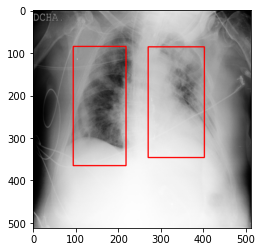

In [ ]:
#Visualize resized image with bounding box
boxes, labels, boxes_albu = boxes_labels('/content/covid/images/000a312787f2.png')
print(boxes_albu)
plot_bbox(image_path, boxes, labels)

# ***Balancing Dataset with Augmentations***

1. **Typical Appearance          2725**
2. **Negative for Pneumonia      1623**
3. **Indeterminate Appearance    1007**
4. **Atypical Appearance          467**

In [ ]:
df.tail()

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1
6329,ffcc6edd9445,NaN,none 1 0 0 1 1,7e6c68462e06,/content/covid/images/ffcc6edd9445.png,none,3,1,4240,3480
6330,ffd91a2c4ca0,NaN,none 1 0 0 1 1,8332bdaddb6e,/content/covid/images/ffd91a2c4ca0.png,none,3,1,2800,3408
6331,ffd9b6cf2961,"[{'x': 2197.38566, 'y': 841.07361, 'width': 31...",opacity 1 2197.38566 841.07361 2513.80265 1292...,7eed9af03814,/content/covid/images/ffd9b6cf2961.png,opacity,0,1,2388,3050
6332,ffdc682f7680,"[{'x': 2729.27083, 'y': 332.26044, 'width': 14...",opacity 1 2729.27083 332.26044 4225.52099 2936...,a0cb0b96fb3d,/content/covid/images/ffdc682f7680.png,opacity,0,1,3488,4256
6333,ffe942c8655f,"[{'x': 208.86463, 'y': 91.53448, 'width': 450....",opacity 1 208.86463 91.53448 659.8321 719.5892...,7d82d53204b8,/content/covid/images/ffe942c8655f.png,opacity,0,1,1140,1387


In [ ]:
label2color = {
    '[1, 0, 0]': [255,0,0], # Typical Appearance
    '[0, 1, 0]': [0,255,0], # Indeterminate Appearance
    '[0, 0, 1]': [0,0,255], # Atypical Appearance
    '[0, 0, 0]': None, # negative
}

label2target = {
    0: 'typical',
    1: 'indeterminate',
    2: 'atypical',
    3: 'negative'
}

In [ ]:
df.head()

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1
0,000a312787f2,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,/content/covid/images/000a312787f2.png,opacity,0,1,3488,4256
1,000c3a3f293f,NaN,none 1 0 0 1 1,ff0879eb20ed,/content/covid/images/000c3a3f293f.png,none,3,1,2320,2832
2,0012ff7358bc,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,/content/covid/images/0012ff7358bc.png,opacity,0,1,2544,3056
3,001398f4ff4f,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,/content/covid/images/001398f4ff4f.png,opacity,2,1,3520,4280
4,001bd15d1891,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,/content/covid/images/001bd15d1891.png,opacity,0,1,2800,3408


Typical Appearance          3007
Negative for Pneumonia      1736
Indeterminate Appearance    1108
Atypical Appearance          483
Name: target, dtype: int64


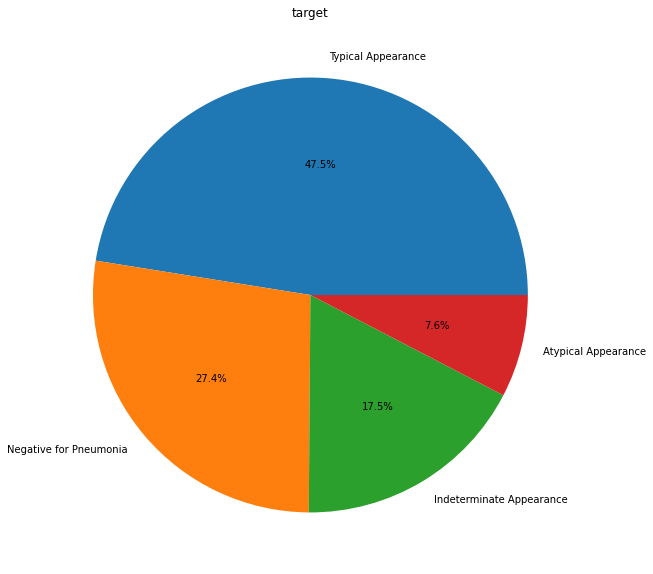

In [ ]:
def pie_plot(df, variable):
    """
        input: variable ex: "Sex"
        output: bar plot & value count
    """
    # get feature
    var = df[variable]
    # count number of categorical variable(value/sample)
    varValue = var.value_counts()
    
    # visualize
    plt.figure(figsize = (20,10))
    plt.pie(varValue, labels=varValue.index, autopct="%1.1f%%")
    plt.title('target')
    plt.show()
    
df['target'] = 'Negative for Pneumonia'
df.loc[df['study_label']==0, 'target'] = 'Typical Appearance'
df.loc[df['study_label']==1, 'target'] = 'Indeterminate Appearance'
df.loc[df['study_label']==2, 'target'] = 'Atypical Appearance'
print(df['target'].value_counts())
pie_plot(df, 'target')   

In [ ]:
typical_df = df[df['study_label'] == 0]
indeterminate_df = df[df['study_label'] == 1]
atypical_df = df[df['study_label'] == 2]
negative_df = df[df['study_label'] == 3]

In [ ]:
typical_df.head(1)

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1,target
0,000a312787f2,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,/content/covid/images/000a312787f2.png,opacity,0,1,3488,4256,Typical Appearance


In [ ]:
atypical_df.head(1)

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1,target
3,001398f4ff4f,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,/content/covid/images/001398f4ff4f.png,opacity,2,1,3520,4280,Atypical Appearance


In [ ]:
indeterminate_df.head(1)

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1,target
5,0022227f5adf,"[{'x': 1857.2065, 'y': 508.30565, 'width': 376...",opacity 1 1857.2065 508.30565 2233.23384 907.8...,84543edc24c2,/content/covid/images/0022227f5adf.png,opacity,1,1,2539,3050,Indeterminate Appearance


In [ ]:
negative_df.head(1)

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1,target
1,000c3a3f293f,NaN,none 1 0 0 1 1,ff0879eb20ed,/content/covid/images/000c3a3f293f.png,none,3,1,2320,2832,Negative for Pneumonia


In [ ]:
print(len(os.listdir('/content/covid/labels')))

6334


In [ ]:
class Transforms():

    def __init__(self, image_path, IMG_SIZE, bboxes = None):
        self.image_path = image_path
        self.bboxes = bboxes
        self.labels = labels
        self.IMG_SIZE = IMG_SIZE

    def scale_up(self, x):
        return x*self.IMG_SIZE

    def get_bboxes(self, transformed_dict):
        transformed_info = np.array(list(map(list, transformed_dict["bboxes"]))).astype(float)
        bboxes = []
        for j in range(len(transformed_info)):
            box = list(transformed_info[j])[:-1]
            box = list(map(self.scale_up, box))
            bboxes.append(box)
        return bboxes

    def verticalFlip(self):

        image = cv2.imread(self.image_path)

        transform = A.Compose([
        A.VerticalFlip(p=1),
        ],
            bbox_params=A.BboxParams(format='yolo')
        )
        verticalFlip = transform(image=image, bboxes = self.bboxes)

        return verticalFlip['image'], self.get_bboxes(verticalFlip)
        
    def rotate90(self):

        image = cv2.imread(self.image_path)

        transform = A.Compose([
        A.RandomRotate90(p=1),
        ],
            bbox_params=A.BboxParams(format='yolo')
        )
        rotate90 = transform(image=image, bboxes = self.bboxes)
        return rotate90['image'], self.get_bboxes(rotate90)
        
    def gaussianBlur(self, blur_limit=(3, 7), sigma_limit=0):

        image = cv2.imread(self.image_path)

        transform = A.Compose([
        A.GaussianBlur (blur_limit=blur_limit, sigma_limit=0, p=1),
        ],
            bbox_params=A.BboxParams(format='yolo')
        )
        
        gaussianBlur = transform(image=image, bboxes = self.bboxes)

        return gaussianBlur['image'], self.get_bboxes(gaussianBlur)

    def affine(self):

        image = cv2.imread(self.image_path)

        transform = A.Compose([
        A.Affine (scale=None, translate_percent=None, translate_px=None, 
                  rotate=None, shear=None, interpolation=1, 
                  cval=0, cval_mask=0, mode=0, fit_output=False, p=1),
        ],
            bbox_params=A.BboxParams(format='yolo')
        )
            
        affine = transform(image=image, bboxes = self.bboxes)
        return affine['image'], self.get_bboxes(affine)

    def flip(self):

        image = cv2.imread(self.image_path)
        transform = A.Compose([
        A.Flip (p=1),
        ],  
            bbox_params=A.BboxParams(format='yolo')
        )
        flip = transform(image=image, bboxes = self.bboxes)
        
        return flip['image'], self.get_bboxes(flip)



In [ ]:
# Testing
# import time
# image_path = '/content/covid/images/0022227f5adf.png'
# plt.imshow(cv2.imread(image_path))
# bboxes, labels, boxes_albu = boxes_labels(image_path)
# print(boxes_albu)
# plot_bbox(image_path, bboxes, labels)
# transforms = Transforms(image_path, IMG_SIZE, boxes_albu)


# start_time = time.time()
# image, bboxes = transforms.gaussianBlur()
# print(bboxes)
# print("--- %s seconds ---" % (time.time() - start_time))

# plot_bbox(image, bboxes, labels)

In [ ]:
df.tail()

,id,boxes,label,StudyInstanceUID,path,image_level,study_label,StudyInstanceUID_count,dim0,dim1,target
6329,ffcc6edd9445,NaN,none 1 0 0 1 1,7e6c68462e06,/content/covid/images/ffcc6edd9445.png,none,3,1,4240,3480,Negative for Pneumonia
6330,ffd91a2c4ca0,NaN,none 1 0 0 1 1,8332bdaddb6e,/content/covid/images/ffd91a2c4ca0.png,none,3,1,2800,3408,Negative for Pneumonia
6331,ffd9b6cf2961,"[{'x': 2197.38566, 'y': 841.07361, 'width': 31...",opacity 1 2197.38566 841.07361 2513.80265 1292...,7eed9af03814,/content/covid/images/ffd9b6cf2961.png,opacity,0,1,2388,3050,Typical Appearance
6332,ffdc682f7680,"[{'x': 2729.27083, 'y': 332.26044, 'width': 14...",opacity 1 2729.27083 332.26044 4225.52099 2936...,a0cb0b96fb3d,/content/covid/images/ffdc682f7680.png,opacity,0,1,3488,4256,Typical Appearance
6333,ffe942c8655f,"[{'x': 208.86463, 'y': 91.53448, 'width': 450....",opacity 1 208.86463 91.53448 659.8321 719.5892...,7d82d53204b8,/content/covid/images/ffe942c8655f.png,opacity,0,1,1140,1387,Typical Appearance


In [ ]:
def save_image_transform(image, image_path, transform):

    path = image_path[:-4] + f"_{transform}.png"
    # print(path)
    cv2.imwrite(path, image)
    return path

def write_bboxes(image_path, bboxes, labels):
    file_name = image_path.replace('images', 'labels')
    file_name = file_name.replace('.png', '.txt')

    # file_name = '/content/drive/MyDrive/Covid_final/Labels/' + file_name.split('/')[-1]
    with open(file_name, 'w') as f:
        for i in range(len(bboxes)):
            bbox = [labels[i]]+bboxes[i]
            bbox = [str(i) for i in bbox]
            bbox = ' '.join(bbox)
            f.write(bbox)
            f.write('\n')
    
    return file_name

def add_to_df(row, df):

    if row[0] not in df['id'].values:  
        df.loc[len(df.index)] = row
    return df

In [ ]:
def get_atypical_transforms(image_path, df):
    labels, boxes_albu = boxes_labels(image_path)[1:]
    transforms = Transforms(image_path, IMG_SIZE, boxes_albu)
    row = df.loc[0].tolist()


    keys = list(df.keys())
    id = keys.index('id')
    path_id = keys.index('path')
    image_level = keys.index('image_level')
    study_label = keys.index('study_label')

    #rgb_shift
    # image, bboxes = transforms.verticalFlip()
    # path = save_image_transform(image, image_path, 'verticalFlip')
    # text_path = write_bboxes(path, bboxes)
    # row[id] = path.split('/')[-1].strip('.png')
    # row[path_id] = path
    # row[image_level] = 'opacity'
    # row[study_label] = 3
    # df = add_to_df(row, df)

    #affine
    image, bboxes = transforms.affine()
    path = save_image_transform(image, image_path, 'affine')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 2
    df = add_to_df(row, df)

    #flip
    image, bboxes = transforms.flip()
    path = save_image_transform(image, image_path, 'flip')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 2
    df = add_to_df(row, df)

    #rotate90
    image, bboxes = transforms.rotate90()
    path = save_image_transform(image, image_path, 'rotate90')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 2
    df = add_to_df(row, df)

    #gaussianBlur
    image, bboxes = transforms.gaussianBlur()
    path = save_image_transform(image, image_path, 'gaussianBlur')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 2
    df = add_to_df(row, df)

def get_indeterminate_transforms(image_path, df):
    labels, boxes_albu = boxes_labels(image_path)[1:]
    transforms = Transforms(image_path, IMG_SIZE, boxes_albu)
    
    row = df.loc[0].tolist()
    keys = list(df.keys())
    id = keys.index('id')
    path_id = keys.index('path')
    image_level = keys.index('image_level')
    study_label = keys.index('study_label')

    #affine
    image, bboxes = transforms.affine()
    path = save_image_transform(image, image_path, 'affine')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 1
    df = add_to_df(row, df)

    #rotate90
    # image, bboxes = transforms.rotate90()
    # path = save_image_transform(image, image_path, 'rotate90')
    # text_path = write_bboxes(path, bboxes, labels)
    # row[id] = path.split('/')[-1].strip('.png')
    # row[path_id] = path
    # row[image_level] = 'opacity'
    # row[study_label] = 1
    # df = add_to_df(row, df)

    #gaussianBlur
    image, bboxes = transforms.gaussianBlur()
    path = save_image_transform(image, image_path, 'gaussianBlur')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'opacity'
    row[study_label] = 1
    df = add_to_df(row, df)

def get_neg_transforms(image_path, df):
    labels, boxes_albu = boxes_labels(image_path)[1:]
    transforms = Transforms(image_path, IMG_SIZE, boxes_albu)
    row = df.loc[0].tolist()

    keys = list(df.keys())
    id = keys.index('id')
    path_id = keys.index('path')
    image_level = keys.index('image_level')
    study_label = keys.index('study_label')

    #rotate90
    image, bboxes = transforms.rotate90()
    path = save_image_transform(image, image_path, 'rotate90')
    text_path = write_bboxes(path, bboxes, labels)
    row[id] = path.split('/')[-1].strip('.png')
    row[path_id] = path
    row[image_level] = 'none'
    row[study_label] = 3
    df = add_to_df(row, df)
    # #gaussianBlur
    # image, bboxes = transforms.gaussianBlur()
    # path = save_image_transform(image, image_path, 'gaussianBlur')
    # text_path = write_bboxes(path, bboxes, labels)
    # row[id] = path.split('/')[-1].strip('.png')
    # row[path_id] = path
    # row[image_level] = 'none'
    # row[study_label] = 3
    # df = add_to_df(row, df)
    



In [ ]:
# df.drop(df.tail(1).index,inplace=True)


In [ ]:
try:   
    del df['StudyInstanceUID'] 
    del df['label']
    del df['boxes']
    del df['StudyInstanceUID_count']
    del df['target']
    del df['dim0']
    del df['dim1']
except:
    pass

In [ ]:
df.tail()

,id,path,image_level,study_label
6329,ffcc6edd9445,/content/covid/images/ffcc6edd9445.png,none,3
6330,ffd91a2c4ca0,/content/covid/images/ffd91a2c4ca0.png,none,3
6331,ffd9b6cf2961,/content/covid/images/ffd9b6cf2961.png,opacity,0
6332,ffdc682f7680,/content/covid/images/ffdc682f7680.png,opacity,0
6333,ffe942c8655f,/content/covid/images/ffe942c8655f.png,opacity,0


In [ ]:
len_df = len(df)
for i in tqdm(range(len_df)):
# for i in range(len(df)):
    row = df.loc[i]
    # Get image-level label
    label = row.image_level
    # split = row.path.split('/')[-2]

    study_label = str(row.study_label)
    # Get image id
    img_id = row.path.split('/')[-1][:-4]
    file_name = f'/content/covid/labels/{img_id}.txt'
    image_path = f'/content/covid/images/{img_id}.png'


    # Indeterminate
    if study_label == '1':
        try:
            get_indeterminate_transforms(image_path, df)
        except:
            print(image_path)

    # Atypical
    elif study_label == '2':
        try:
            get_atypical_transforms(image_path, df)
        except:
            print(image_path)

    # Negative
    elif study_label== '3':
        try:
            get_neg_transforms(image_path, df)
        except:
            print(image_path)

    else:
        continue
    
    


  6%|▌         | 360/6334 [00:06<01:34, 63.30it/s]

/content/covid/images/0b9718f58e68.png


  6%|▌         | 387/6334 [00:06<01:41, 58.79it/s]

/content/covid/images/0cdfd3a820cb.png


 12%|█▏        | 786/6334 [00:14<01:21, 67.71it/s]

/content/covid/images/1c306780d2f7.png


 18%|█▊        | 1135/6334 [00:20<01:30, 57.71it/s]

/content/covid/images/2a0e69dfaa72.png


 22%|██▏       | 1413/6334 [00:25<01:13, 67.04it/s]

/content/covid/images/49f010752fd8.png


100%|██████████| 6334/6334 [01:57<00:00, 53.91it/s]


In [ ]:
print(len(os.listdir('/content/covid/images')))
print(len(os.listdir('/content/covid/labels')))

12208
12208


**After Balancing**

Negative for Pneumonia      3472
Indeterminate Appearance    3314
Typical Appearance          3007
Atypical Appearance         2415
Name: target, dtype: int64


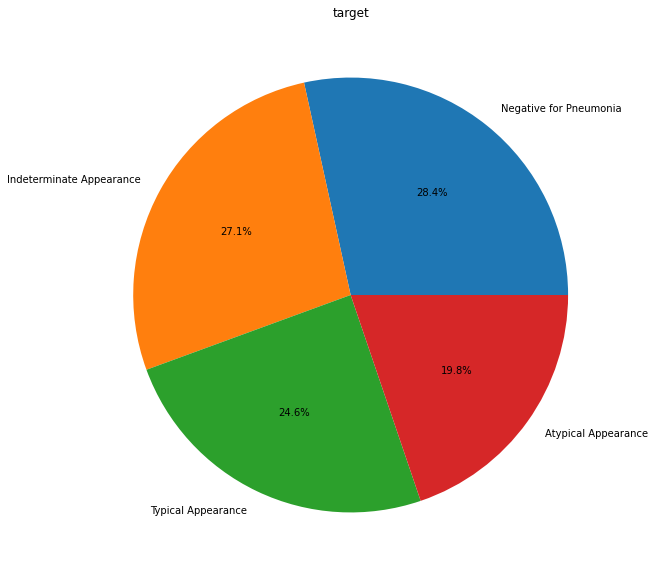

In [ ]:
def pie_plot(df, variable):
    """
        input: variable ex: "Sex"
        output: bar plot & value count
    """
    # get feature
    var = df[variable]
    # count number of categorical variable(value/sample)
    varValue = var.value_counts()
    
    # visualize
    plt.figure(figsize = (20,10))
    plt.pie(varValue, labels=varValue.index, autopct="%1.1f%%")
    plt.title('target')
    plt.show()
    
df['target'] = 'Typical Appearance'
df.loc[df['study_label']==1, 'target'] = 'Indeterminate Appearance'
df.loc[df['study_label']==2, 'target'] = 'Atypical Appearance'
df.loc[df['study_label']==3, 'target'] = 'Negative for Pneumonia'
print(df['target'].value_counts())
pie_plot(df, 'target')   

In [ ]:
df.to_csv('/content/drive/MyDrive/Covid_final/final_df.csv')

# **Lung Segmentation**

In [ ]:
!mkdir /content/covid/Lung_segmentation/

In [ ]:
import numpy as np 
import tensorflow as tf
import pandas as pd
from tqdm import tqdm
import os
from cv2 import imread, createCLAHE 
import cv2
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt

image_path = "/content/covid/images"

In [ ]:
def getData(img_dir, X_shape):
    im_array = []
    
    for i in tqdm(os.listdir(img_dir)): 
        im = cv2.resize(cv2.imread(os.path.join(image_path,i)),(X_shape,X_shape))[:,:,0]
        im_array.append(im)

    return im_array

In [ ]:
def plotMask(X,y):
    sample = []
    
    for i in range(6):
        left = X[i]
        right = y[i]
        combined = np.hstack((left,right))
        sample.append(combined)
        
        
    for i in range(0,6,3):

        plt.figure(figsize=(25,10))
        
        plt.subplot(2,3,1+i)
        plt.imshow(sample[i])
        
        plt.subplot(2,3,2+i)
        plt.imshow(sample[i+1])
        
        
        plt.subplot(2,3,3+i)
        plt.imshow(sample[i+2])
        
        plt.show()

In [ ]:
dim = 256*2
image_data = getData(image_path, dim)

100%|██████████| 12208/12208 [01:01<00:00, 199.57it/s]


In [ ]:
cv2.imwrite('check.jpg',image_data[0])

True

In [ ]:
images = np.array(image_data).reshape(len(image_data),dim,dim)

In [ ]:
# plotMask(images, images)

In [ ]:
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, LearningRateScheduler


def dice_coef(y_true, y_pred):
    y_true_f = keras.flatten(y_true)
    y_pred_f = keras.flatten(y_pred)
    intersection = keras.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (keras.sum(y_true_f) + keras.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def unet(input_size=(256,256,1)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
from tensorflow.keras.optimizers import Adam
model = unet(input_size=(512,512,1))
model.compile(optimizer=Adam(learning_rate=1e-5), loss=dice_coef_loss,
                  metrics=[dice_coef, 'binary_accuracy'])
# model.summary()

In [ ]:
weights_path = '/content/cxr_reg_weights.best.hdf5'
model.load_weights(weights_path)   

In [ ]:
# images_scaled = (images-127.0)/127.0

In [ ]:
# pred_candidates = np.random.randint(1,images.shape[0],10)
# preds = model.predict(images_scaled)

In [ ]:
# ori = np.squeeze(images[pred_candidates[1]])
# plt.imsave('ori.jpg', ori)

In [ ]:
# mask_img = np.squeeze(preds[pred_candidates[1]])
# mask = np.where(mask_img < 0.01)
# non_mask = np.where(mask_img > 0)
# overlay = ori
# overlay[mask] = 0
# plt.imshow(mask_img)

# print(mask_img.shape)
# cv2.imwrite('overlay.jpg',overlay)

In [ ]:
# image_data
# images_scaled

In [ ]:
def apply_lung_segmentation(image_path, save_path, dim = 256*2):
  
  image_data = [cv2.resize(cv2.imread(image_path),(dim,dim))[:,:,0]]
  images = np.array(image_data).reshape(len(image_data),dim,dim)
  images_scaled = (images-127.0)/127.0
  preds = model.predict(images_scaled)

  ori = np.squeeze(images[0])

  mask_img = np.squeeze(preds[0])
  mask = np.where(mask_img < 0.01)
  non_mask = np.where(mask_img > 0)
  overlay = ori
  overlay[mask] = 0
  cv2.imwrite(save_path,overlay)


In [ ]:
lung_df = df.copy()
lung_df['path'] = lung_df['path'].apply(lambda x: '/content/drive/MyDrive/Covid_final/Lung_segmentation/' + x.split('/')[-1])
lung_df.head()

,id,path,image_level,study_label,target
0,000a312787f2,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance
1,000c3a3f293f,/content/drive/MyDrive/Covid_final/Lung_segmen...,none,3,Negative for Pneumonia
2,0012ff7358bc,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance
3,001398f4ff4f,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,2,Atypical Appearance
4,001bd15d1891,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance


In [ ]:
len_df = len(lung_df)
for i in tqdm(range(len_df)):
# for i in range(len(df)):
    row = df.loc[i]
    # Get image-level label
    label = row.image_level

    study_label = str(row.study_label)
    # Get image id
    img_id = row.path.split('/')[-1][:-4]
    image_path = f'/content/covid/images/{img_id}.png'
    save_path = f'/content/drive/MyDrive/Covid_final/Lung_segmentation/{img_id}.png'
    apply_lung_segmentation(image_path, save_path) 

100%|██████████| 12208/12208 [16:21<00:00, 12.44it/s]


In [ ]:
lung_df['path'].values[0]

'/content/drive/MyDrive/Covid_final/Lung_segmentation/000a312787f2.png'

In [ ]:
lung_df.to_csv('/content/drive/MyDrive/Covid_final/lung_df.csv')

# **Apply Superpixel Segmentation**

In [ ]:
import os
# df = pd.read_csv('/content/drive/MyDrive/Covid_final/final_reduced_df.csv')
# if REDUCED_SIZE:
#     images = os.listdir('/content/covid/images')
# else:
#     images = os.listdir('/content/covid/images_subset')
df = pd.read_csv('/content/drive/MyDrive/Covid_final/lung_df.csv')
images = os.listdir('/content/drive/MyDrive/Covid_final/Lung_segmentation/')
image_path = '/content/drive/MyDrive/Covid_final/Lung_segmentation/' + images[10]

In [ ]:
def superpixel(image_path, segments):

    image = cv2.imread(image_path)
    # print(image.shape)
    transform = A.Compose([
    A.Superpixels (p_replace=0.1, n_segments = segments, max_size=128, interpolation=1, always_apply=False, p=1),
])
    superpixel_img = transform(image=image)['image']
    return superpixel_img


In [ ]:
print(len(images))

12208


--- 0.38713502883911133 seconds ---


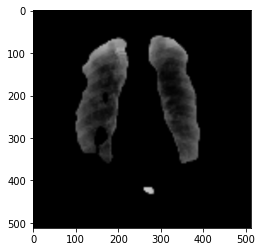

In [ ]:
import time
start_time = time.time()
superpixel_image = superpixel(image_path, 5000)
print("--- %s seconds ---" % (time.time() - start_time))
superpixel_image = cv2.cvtColor(superpixel_image, cv2.COLOR_BGR2RGB)
plt.imshow(superpixel_image)

In [ ]:
shutil.copytree('/content/covid/labels','/content/drive/MyDrive/Covid_final/labels')

'/content/drive/MyDrive/Covid_final/labels'

In [ ]:
SUPERPIXEL_DIR = '/content/drive/MyDrive/Covid_final/Lung_superpixel/'

In [ ]:
lung_paths = os.listdir('/content/drive/MyDrive/Covid_final/Lung_segmentation/')

In [ ]:
# len_df = len(lung_df)
# for i in tqdm(range(len_df)):
# # for i in range(len(df)):
#     row = lung_df.loc[i]
#     # Get image-level label
#     label = row.image_level

#     study_label = str(row.study_label)

#     # Get image id
#     img_id = row.path.split('/')[-1][:-4]
#     image_path = f'/content/covid/Lung_segmentation/{img_id}.png'
#     print(image_path)
#     superpixel_image = superpixel(image_path, 5000)
#     cv2.imwrite(SUPERPIXEL_DIR + img_id + '.png', superpixel_image) 

for i in tqdm(lung_paths):

  image_path = f'/content/drive/MyDrive/Covid_final/Lung_segmentation/{i}'
  superpixel_image = superpixel(image_path, 5000)
  cv2.imwrite(SUPERPIXEL_DIR + i, superpixel_image) 

100%|██████████| 12208/12208 [47:17<00:00,  4.30it/s]


In [ ]:
superpixel_df = df.copy()
superpixel_df['path'] = superpixel_df['path'].apply(lambda i : '/content/drive/MyDrive/Covid_final/Lung_superpixel/' + i.split('/')[-1])
superpixel_df.head()

,Unnamed: 0,id,path,image_level,study_label,target
0,0,000a312787f2,/content/drive/MyDrive/Covid_final/Lung_superp...,opacity,0,Typical Appearance
1,1,000c3a3f293f,/content/drive/MyDrive/Covid_final/Lung_superp...,none,3,Negative for Pneumonia
2,2,0012ff7358bc,/content/drive/MyDrive/Covid_final/Lung_superp...,opacity,0,Typical Appearance
3,3,001398f4ff4f,/content/drive/MyDrive/Covid_final/Lung_superp...,opacity,2,Atypical Appearance
4,4,001bd15d1891,/content/drive/MyDrive/Covid_final/Lung_superp...,opacity,0,Typical Appearance


In [ ]:
print(len(superpixel_df))

12208


In [ ]:
superpixel_df.to_csv('/content/drive/MyDrive/Covid_final/lung_superpixel.csv')

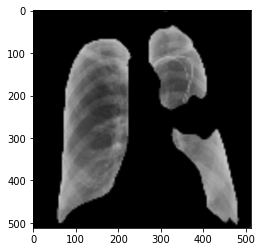

In [ ]:
plt.imshow(cv2.imread('/content/drive/MyDrive/Covid_final/Lung_superpixel/9e844dea386a.png'))

# **Apply Deoldify**

In [ ]:
%cd /content

/content


In [ ]:
!mkdir /content/covid/deoldify_images
!mkdir /content/covid/deoldify_superpixel_images

In [ ]:
DEOLDIFY_DIR = '/content/drive/MyDrive/Covid_final/Lung_Deoldify/'
SD_DIR = '/content/drive/MyDrive/Covid_final/Lung_SD/'

In [ ]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 2297, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 2297 (delta 33), reused 17 (delta 5), pack-reused 2228
Receiving objects: 100% (2297/2297), 69.44 MiB | 33.37 MiB/s, done.
Resolving deltas: 100% (1040/1040), done.


In [ ]:
%cd /content/DeOldify

/content/DeOldify


In [ ]:
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [ ]:
!pip install -r colab_requirements.txt

In [ ]:
import fastai
from deoldify.visualize import *

torch.backends.cudnn.benchmark = True

In [ ]:
!mkdir 'models'
!wget https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

--2021-11-02 09:35:09--  https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth [following]
--2021-11-02 09:35:10--  https://www.dropbox.com/s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uced8b125c2a121e35367d1cf2bb.dl.dropboxusercontent.com/cd/0/inline/BZMlDdMLwOouIhCt232uSQLonnkhEV3VmbRVE-i6-e47ux6HwB9Y2a1UomEa-Dy9mr6Ld_jhEakcOirUNEnrs89eBRSFMqWOYp79hGxYEaOp_-sLArEGpqdfYa_MQsa36b-Yo5D1brB3s7zoFCWsfeb_/file# [following]
--2021-11-02 09:35:10--  https://uced8b125c2a121e35367d1cf2bb.dl.dropboxusercontent.com/cd/0/inline/BZMlDdMLwOouIhCt232uSQLonnkhEV3VmbRVE-i6-e47ux6HwB9Y2a1

In [ ]:
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2021-11-02 09:35:32--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2021-11-02 09:35:33 (62.5 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [ ]:
colorizer = get_image_colorizer(artistic=False)

/usr/local/lib/python3.7/dist-packages/fastai/data_block.py:442: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/usr/local/lib/python3.7/dist-packages/fastai/data_block.py:445: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential s

  0%|          | 0.00/171M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [ ]:
def colorize(image_path, save_path):
    render_factor = 35  
    colored_image = colorizer.get_transformed_image(image_path, render_factor=render_factor)
    #     display(colored_image)
    colored_image.save(save_path)

In [ ]:
df.head()

,Unnamed: 0,id,path,image_level,study_label,target
0,0,000a312787f2,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance
1,1,000c3a3f293f,/content/drive/MyDrive/Covid_final/Lung_segmen...,none,3,Negative for Pneumonia
2,2,0012ff7358bc,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance
3,3,001398f4ff4f,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,2,Atypical Appearance
4,4,001bd15d1891,/content/drive/MyDrive/Covid_final/Lung_segmen...,opacity,0,Typical Appearance


In [ ]:
# len_df = len(reduced_df)
# for i in tqdm(range(len_df)):
# # for i in range(len(df)):
#     row = df.loc[i]
#     # Get image-level label
#     label = row.image_level

#     study_label = str(row.study_label)

#     # Get image id
#     img_id = row.path.split('/')[-1][:-4]
#     image_path = f'/content/covid/images/{img_id}.png'

#     colorize(image_path, DEOLDIFY_DIR + img_id + '.png')

for i in tqdm(lung_paths):
  image_path = f'/content/drive/MyDrive/Covid_final/Lung_segmentation/{i}'
  colorize(image_path, DEOLDIFY_DIR + i)

In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/Covid_final/final_reduced_df.csv')

In [ ]:
deoldify_df = df.copy()
deoldify_df['path'] = deoldify_df['path'].apply(lambda i : i.replace('images', 'deoldify_images'))
deoldify_df.head()

,Unnamed: 0,id,path,image_level,study_label,target
0,0,000a312787f2,/content/drive/MyDrive/Covid_classification/Lu...,opacity,0,Typical Appearance
1,1,000c3a3f293f,/content/drive/MyDrive/Covid_classification/Lu...,none,3,Negative for Pneumonia
2,2,0012ff7358bc,/content/drive/MyDrive/Covid_classification/Lu...,opacity,0,Typical Appearance
3,3,001398f4ff4f,/content/drive/MyDrive/Covid_classification/Lu...,opacity,2,Atypical Appearance
4,4,001bd15d1891,/content/drive/MyDrive/Covid_classification/Lu...,opacity,0,Typical Appearance


In [ ]:
!rm -rf /content/covid/deoldify_superpixel_images
!mkdir /content/covid/deoldify_superpixel_images

SuperPixel + Deoldify

In [ ]:
# len_df = len(superpixel_df)
# for i in tqdm(range(len_df)):
# # for i in range(len(df)):
#     row = df.loc[i]
#     # Get image-level label
#     label = row.image_level

#     study_label = str(row.study_label)

#     # Get image id
#     img_id = row.path.split('/')[-1][:-4]

#     image_path = f'/content/covid/superpixel_images/{img_id}.png'

#     colorize(image_path, SD_DIR + img_id + '.png')   

for i in tqdm(lung_paths):
  image_path = f'/content/drive/MyDrive/Covid_final/Lung_superpixel/{i}'
  colorize(image_path, SD_DIR + i)

100%|██████████| 12208/12208 [1:05:35<00:00,  3.10it/s]


In [ ]:
deoldify_sp_df = superpixel_df.copy()
deoldify_sp_df['path'] = deoldify_sp_df['path'].apply(lambda i : '/content/drive/MyDrive/Covid_final/Lung_SD/' + i.split('/')[-1])
deoldify_sp_df.head()

,Unnamed: 0,id,path,image_level,study_label,target
0,0,000a312787f2,/content/drive/MyDrive/Covid_final/Lung_SD/000...,opacity,0,Typical Appearance
1,1,000c3a3f293f,/content/drive/MyDrive/Covid_final/Lung_SD/000...,none,3,Negative for Pneumonia
2,2,0012ff7358bc,/content/drive/MyDrive/Covid_final/Lung_SD/001...,opacity,0,Typical Appearance
3,3,001398f4ff4f,/content/drive/MyDrive/Covid_final/Lung_SD/001...,opacity,2,Atypical Appearance
4,4,001bd15d1891,/content/drive/MyDrive/Covid_final/Lung_SD/001...,opacity,0,Typical Appearance


In [ ]:
deoldify_sp_df.to_csv('/content/drive/MyDrive/Covid_final/lung_deoldify_sp_df.csv')

In [ ]:
plt.imshow(cv2.imread('/content/covid/deoldify_superpixel_images/0022227f5adf.png'))

# **Reducing dataset for testing**

In [ ]:
# original_df = df
# if SUPERPIXEL:
#     df = superpxiel_df

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Covid_final/lung_deoldify_sp_df.csv')
print(len(df))

12208


In [ ]:
import shutil, os
import random
NO_OF_SAMPLES = 100
# os.mkdir('/content/covid/images_subset')

In [ ]:
!mkdir /content/covid/images_subset

In [ ]:
typical_df = df[df["study_label"] == 0].sample(n = 2000)
# intermediate_df = df[df["study_label"] == 1].sample(n = 2000)
# atypical_df = df[df["study_label"] == 2].sample(n = 2000)
# neg_df = df[df["study_label"] == 3].sample(n = 2000)

frames = [typical_df]
reduced_df = pd.concat(frames)
reduced_df.head()

,Unnamed: 0,Unnamed: 0.1,id,path,image_level,study_label,target
2551,2551,2551,61d8f4b28030,/content/drive/MyDrive/Covid_final/Lung_SD/61d...,opacity,0,Typical Appearance
1094,1094,1094,28e9e044dc31,/content/drive/MyDrive/Covid_final/Lung_SD/28e...,opacity,0,Typical Appearance
6187,6187,6187,f9d20afa051a,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...,opacity,0,Typical Appearance
5052,5052,5052,c8ed6a592b17,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...,opacity,0,Typical Appearance
2219,2219,2219,53f58deb8cf6,/content/drive/MyDrive/Covid_final/Lung_SD/53f...,opacity,0,Typical Appearance


In [ ]:
ids = reduced_df['id'].tolist()
print(ids[0])
print(len(ids))

61d8f4b28030
2000


In [ ]:
# NEW_DIR = '/content/covid/images_subset/'
# for id in tqdm(ids):
#     img_path = df[df['id'] == id]['path'].values[0]
#     shutil.copy(img_path, NEW_DIR)

# print(len(os.listdir(NEW_DIR)))

# **Preparing Data For Yolo**

In [ ]:
import os
from tqdm import tqdm

In [ ]:
!rm -rf /content/covid/labels/train
!rm -rf /content/covid/labels/test
!rm -rf /content/covid/yolo_annotations
!rm -rf /content/covid/siim-cov19

In [ ]:
os.mkdir('/content/covid')
os.mkdir('/content/covid/yolo_annotations')

In [ ]:
!unzip /content/drive/MyDrive/Covid_final/labels.zip -d /content/covid

In [ ]:
label_dir = '/content/covid/labels'
print(len(os.listdir(label_dir)))

12208


In [ ]:
label_dir = '/content/covid/labels/'
yolo_annotations_dir = '/content/covid/yolo_annotations/'

for label_file in tqdm(os.listdir(label_dir)):

    file = ''
    yolo_bboxes = ''
    # print(label_dir + label_file)
    with open(label_dir + label_file) as f:
        lines = f.readlines()
        # print(lines)
        for line in lines:
            line = list(map(float, line.strip('/n').split(" ")))
            line[1:] = list(map(lambda x: x/IMG_SIZE, line[1:]))
            line[0] = int(line[0])
            for box in line:
                yolo_bboxes = yolo_bboxes + str(box) + ' '
            yolo_bboxes = yolo_bboxes + '\n'


    with open(yolo_annotations_dir + label_file, "w") as f:
        f.write(yolo_bboxes)

100%|██████████| 12208/12208 [00:00<00:00, 13301.68it/s]


In [ ]:
import numpy as np, pandas as pd
from glob import glob
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns

In [ ]:
# if REDUCED_SIZE:
#     df = pd.read_csv('/content/drive/MyDrive/Covid_final/final_reduced_df.csv')
# else:
#     df = pd.read_csv('/content/drive/MyDrive/Covid_final/final_df.csv')

# if DEOLDIFY:
#     df = deoldify_df
# if SUPERPIXEL:
#     df = superpixel_df
# if DEOLDIFY and SUPERPIXEL:
#     df = deoldify_sp_df

# df = pd.read_csv('/content/drive/MyDrive/Covid_final/dataframes/deoldify_sp_df_segmented.csv')
df = reduced_df.copy().reset_index()
print(df['path'].values[0])
df['id'] = df['id'].apply(lambda x: x.replace('_fli', ''))
print(len(df))
df.head()

/content/drive/MyDrive/Covid_final/Lung_SD/61d8f4b28030.png
2000


,index,Unnamed: 0,Unnamed: 0.1,id,path,image_level,study_label,target
0,2551,2551,2551,61d8f4b28030,/content/drive/MyDrive/Covid_final/Lung_SD/61d...,opacity,0,Typical Appearance
1,1094,1094,1094,28e9e044dc31,/content/drive/MyDrive/Covid_final/Lung_SD/28e...,opacity,0,Typical Appearance
2,6187,6187,6187,f9d20afa051a,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...,opacity,0,Typical Appearance
3,5052,5052,5052,c8ed6a592b17,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...,opacity,0,Typical Appearance
4,2219,2219,2219,53f58deb8cf6,/content/drive/MyDrive/Covid_final/Lung_SD/53f...,opacity,0,Typical Appearance


In [ ]:
from sklearn.model_selection import GroupKFold
fold = 0
gkf  = GroupKFold(n_splits = 5)
df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(df, groups = df.id.tolist())):
    df.loc[val_idx, 'fold'] = fold

In [ ]:
# print(os.listdir('/content/drive/MyDrive/Covid_final/Lung_SD/')[0])
# print(len(os.listdir('/content/drive/MyDrive/Covid_final/Lung_SD/')))

In [ ]:
train_df = df.copy()
# print(len(os.listdir('/content/drive/MyDrive/Covid_final/Lung_SD')))
# print(os.path.isfile('/content/covid/labels/6adce4fc71b0_rotate90.txt'))

In [ ]:
if DEOLDIFY:
    path = '/content/drive/MyDrive/Covid_final/Lung_Deoldify/'
if SUPERPIXEL:
    path = '/content/drive/MyDrive/Covid_final/Lung_superpixel/'
if SUPERPIXEL and DEOLDIFY:
    path = '/content/drive/MyDrive/Covid_final/Lung_SD/'

train_df['image_path'] = f'{path}' + train_df.id
train_df['image_path'] = train_df.apply(lambda row: row['image_path'] + ".png", axis = 1)
print(len(train_df))
train_df.head()

2000


,index,Unnamed: 0,Unnamed: 0.1,id,path,image_level,study_label,target,fold,image_path
0,2551,2551,2551,61d8f4b28030,/content/drive/MyDrive/Covid_final/Lung_SD/61d...,opacity,0,Typical Appearance,0,/content/drive/MyDrive/Covid_final/Lung_SD/61d...
1,1094,1094,1094,28e9e044dc31,/content/drive/MyDrive/Covid_final/Lung_SD/28e...,opacity,0,Typical Appearance,2,/content/drive/MyDrive/Covid_final/Lung_SD/28e...
2,6187,6187,6187,f9d20afa051a,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...,opacity,0,Typical Appearance,1,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...
3,5052,5052,5052,c8ed6a592b17,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...,opacity,0,Typical Appearance,3,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...
4,2219,2219,2219,53f58deb8cf6,/content/drive/MyDrive/Covid_final/Lung_SD/53f...,opacity,0,Typical Appearance,1,/content/drive/MyDrive/Covid_final/Lung_SD/53f...


In [ ]:
print(train_df['path'].values[0])

/content/drive/MyDrive/Covid_final/Lung_SD/61d8f4b28030.png


In [ ]:
classes = ['0. typical']

In [ ]:
train_files = []
val_files   = []
val_files += list(train_df[train_df.fold==fold].image_path.unique())
train_files += list(train_df[train_df.fold!=fold].image_path.unique())
len(train_files), len(val_files)

(1600, 400)

In [ ]:
train_df.rename(columns={'study_label': 'class_id'}, inplace=True)
train_df.head()

,index,Unnamed: 0,Unnamed: 0.1,id,path,image_level,class_id,target,fold,image_path
0,2551,2551,2551,61d8f4b28030,/content/drive/MyDrive/Covid_final/Lung_SD/61d...,opacity,0,Typical Appearance,0,/content/drive/MyDrive/Covid_final/Lung_SD/61d...
1,1094,1094,1094,28e9e044dc31,/content/drive/MyDrive/Covid_final/Lung_SD/28e...,opacity,0,Typical Appearance,2,/content/drive/MyDrive/Covid_final/Lung_SD/28e...
2,6187,6187,6187,f9d20afa051a,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...,opacity,0,Typical Appearance,1,/content/drive/MyDrive/Covid_final/Lung_SD/f9d...
3,5052,5052,5052,c8ed6a592b17,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...,opacity,0,Typical Appearance,3,/content/drive/MyDrive/Covid_final/Lung_SD/c8e...
4,2219,2219,2219,53f58deb8cf6,/content/drive/MyDrive/Covid_final/Lung_SD/53f...,opacity,0,Typical Appearance,1,/content/drive/MyDrive/Covid_final/Lung_SD/53f...


In [ ]:
from tqdm.notebook import tqdm
import shutil
os.makedirs('/content/covid/siim-cov19/labels/train', exist_ok = True)
os.makedirs('/content/covid/siim-cov19/labels/val', exist_ok = True)
os.makedirs('/content/covid/siim-cov19/images/train', exist_ok = True)
os.makedirs('/content/covid/siim-cov19/images/val', exist_ok = True)
label_dir = '/content/covid/yolo_annotations/'
for file in tqdm(train_files):
    
    shutil.copy(file, '/content/covid/siim-cov19/images/train')
    filename = file.split('/')[-1].split('.')[0]
    
    label_file = os.path.join(label_dir, filename+'.txt')
    image_id = label_file.split('/')[-1].replace('.txt', '')
    # class_id = train_df[train_df['id'] == image_id]['class_id'].values[0]
    class_id = 0

    file_text = ""
    with open(label_file) as f:
        text = f.read()
        if len(text) is not 0:
            text = text.split(" ")
            text[0] = str(class_id)
            temp_text = ""
            for i in text:
                temp_text = temp_text + i + " "
            file_text = temp_text + "\n"
            f.seek(0)
#     print(file_text)
    with open('/content/covid/siim-cov19/labels/train/' + label_file.split('/')[-1], "w") as f:
        f.write(file_text)
        
for file in tqdm(val_files):
    shutil.copy(file, '/content/covid/siim-cov19/images/val')
    filename = file.split('/')[-1].split('.')[0]
    label_file = os.path.join(label_dir, filename+'.txt')

    image_id = label_file.split('/')[-1].replace('.txt', '')
    # class_id = train_df[train_df['id'] == image_id]['class_id'].values[0]
    class_id = 0

    file_text = ""
    with open(label_file) as f:
        text = f.read()
        if len(text) is not 0:
            text = text.split(" ")
            text[0] = str(class_id)
            temp_text = ""
            for i in text:
                temp_text = temp_text + i + " "
            file_text = temp_text + "\n"
            f.seek(0)
#     print(file_text)
    with open('/content/covid/siim-cov19/labels/val/' + label_file.split('/')[-1], "w") as f:
        f.write(file_text)

  0%|          | 0/1600 [00:00<?, ?it/s]

  0%|          | 0/400 [00:00<?, ?it/s]

In [ ]:
with open("/content/covid/siim-cov19/labels/train/" + f"{train_files[1].split('/')[-1].replace('.png', '.txt')}") as f:
    text = f.read()
#     text = re.sub('0', class_id, text)
    print(text)
    f.seek(0)
classes = ['0. typical']

0 0.69921875 0.529296875 0.1953125 0.478515625 
0 0.2421875 0.5546875 0.244140625 0.455078125 
 



# **YOLO**

In [ ]:
from os import listdir
from os.path import isfile, join
import yaml
from glob import glob

cwd = '/content/covid/'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/content/covid/siim-cov19/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/content/covid/siim-cov19/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = len(classes),
    names = classes
    )

with open(join( cwd , 'siim-cov19.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'siim-cov19.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- 0. typical
nc: 1
train: /content/covid/train.txt
val: /content/covid/val.txt



In [ ]:
# !git clone https://github.com/ultralytics/yolov5 

In [ ]:
# !cp -r /content/yolov5 /content/covid/yolov5
# !rm -rf /content/yolov5

In [ ]:
# !pip install -r requirements.txt

In [ ]:
!rm -rf /content/covid/yolov5

In [ ]:
# https://www.kaggle.com/ultralytics/yolov5
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
shutil.copytree('/content/drive/MyDrive/Covid_final/yolov5', '/content/covid/yolov5')
os.chdir('/content/covid/yolov5')


import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
%pip install -qr requirements.txt # install dependencies

     |████████████████████████████████| 596 kB 2.6 MB/s 


In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/
Image(filename='runs/detect/exp2/zidane.jpg', width=600)

In [ ]:
# deoldify_sp_df.to_csv('/content/drive/MyDrive/Covid_final/dataframes/deoldify_sp_df_segmented.csv')
# superpixel_df.to_csv('/content/drive/MyDrive/Covid_final/dataframes/superpixel_df.csv')

# **Train**

In [ ]:
%cd /content/covid/yolov5

/content


In [ ]:
# !WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --nosave --cache 
!WANDB_MODE="dryrun" python train.py --img 512 --batch 16  --epochs 300 --data /content/covid/siim-cov19.yaml --hyp /content/drive/MyDrive/Covid_classification/hyp.scratch.yaml --weights /content/drive/MyDrive/Covid_final/runs_segmentation_atypical_300epochs/train/exp2/weights/best.pt --cache

Using torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='/content/covid/siim-cov19.yaml', device='', epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='/content/drive/MyDrive/Covid_classification/hyp.scratch.yaml', image_weights=False, img_size=[512, 512], local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/exp4', single_cls=False, sync_bn=False, total_batch_size=16, weights='/content/drive/MyDrive/Covid_final/runs_segmentation_atypical_300epochs/train/exp2/weights/best.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'lrf': 0.032, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, '

# **Visualize Results**

In [ ]:
# os.mkdir("/content/drive/MyDrive/Covid_final/typical")
# save_dir = "/content/drive/MyDrive/Covid_final/"
save_dir = "/content/drive/MyDrive/Covid_final/"

True

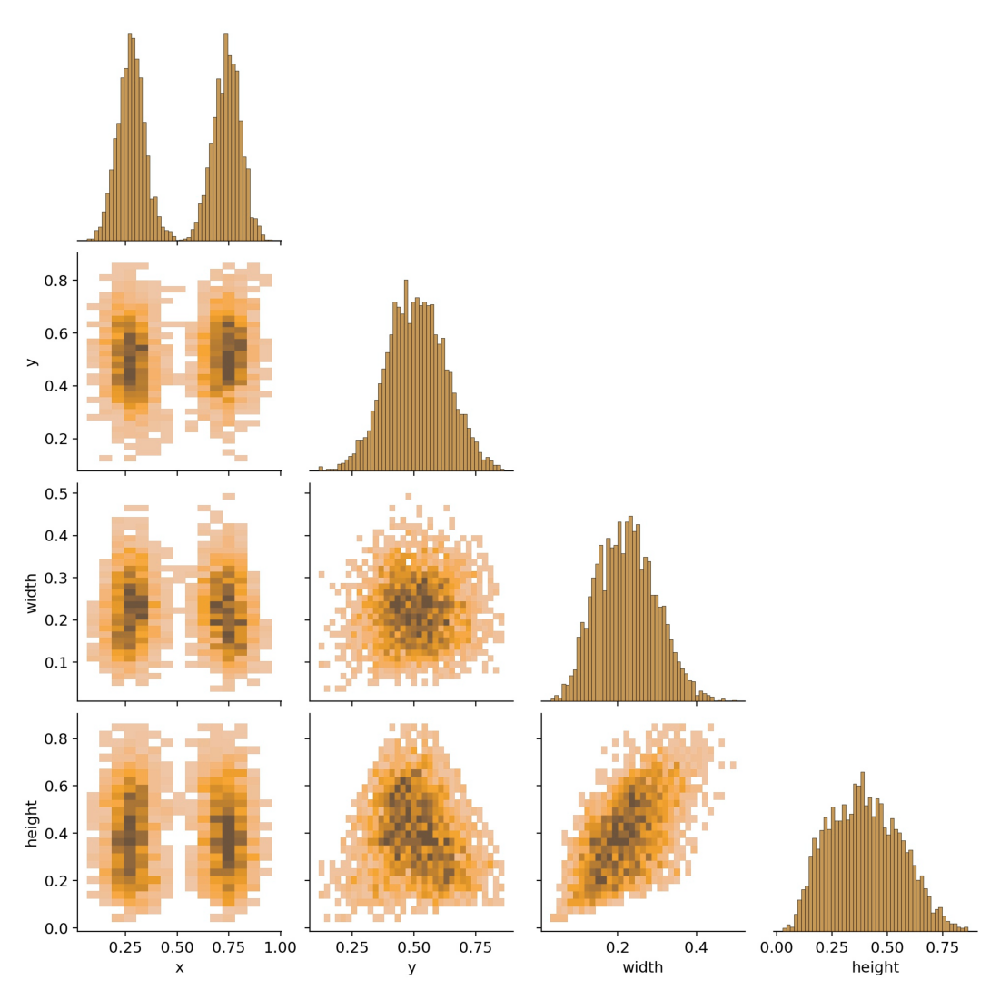

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
img = cv2.imread('runs/train/exp3/labels_correlogram.jpg')
plt.imshow(img);
cv2.imwrite(save_dir + 'labels_correlogram.jpg', img)

True

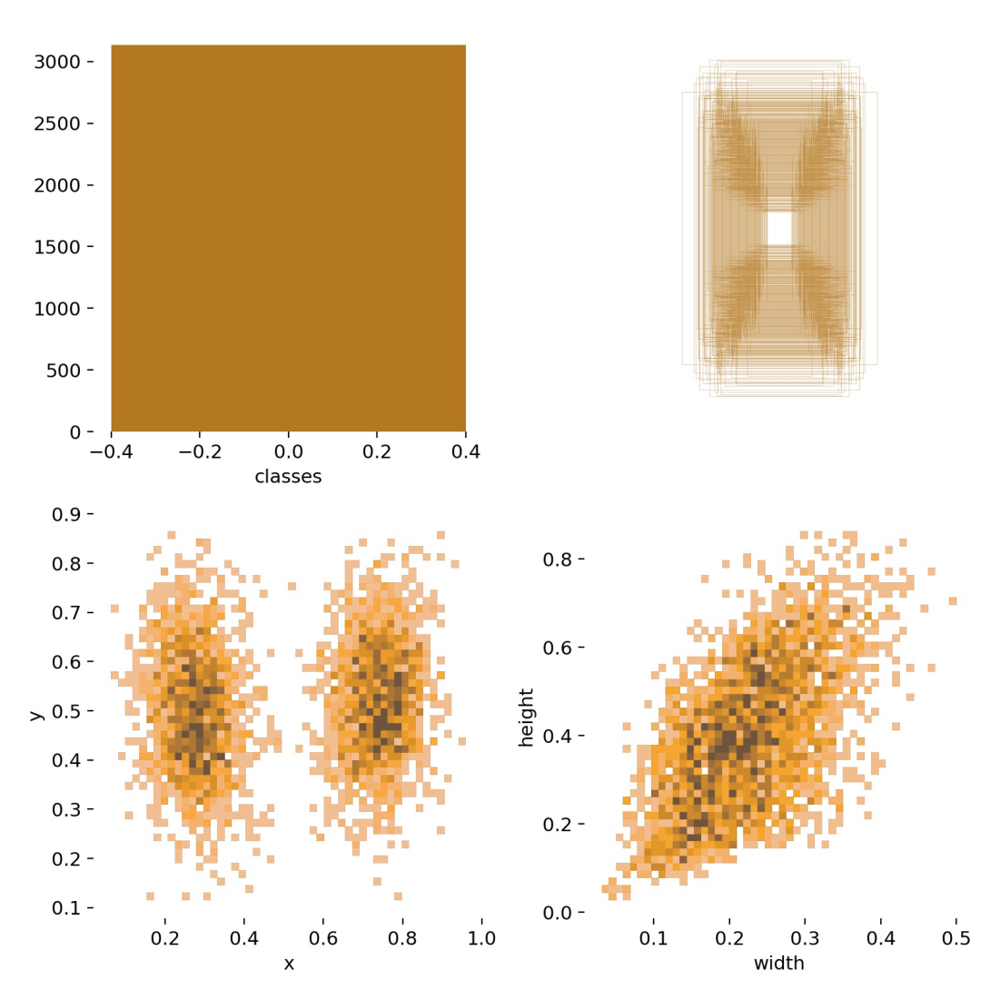

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
img = cv2.imread('runs/train/exp3/labels.jpg')
plt.imshow(img);
cv2.imwrite(save_dir + 'labels.jpg', img)

True

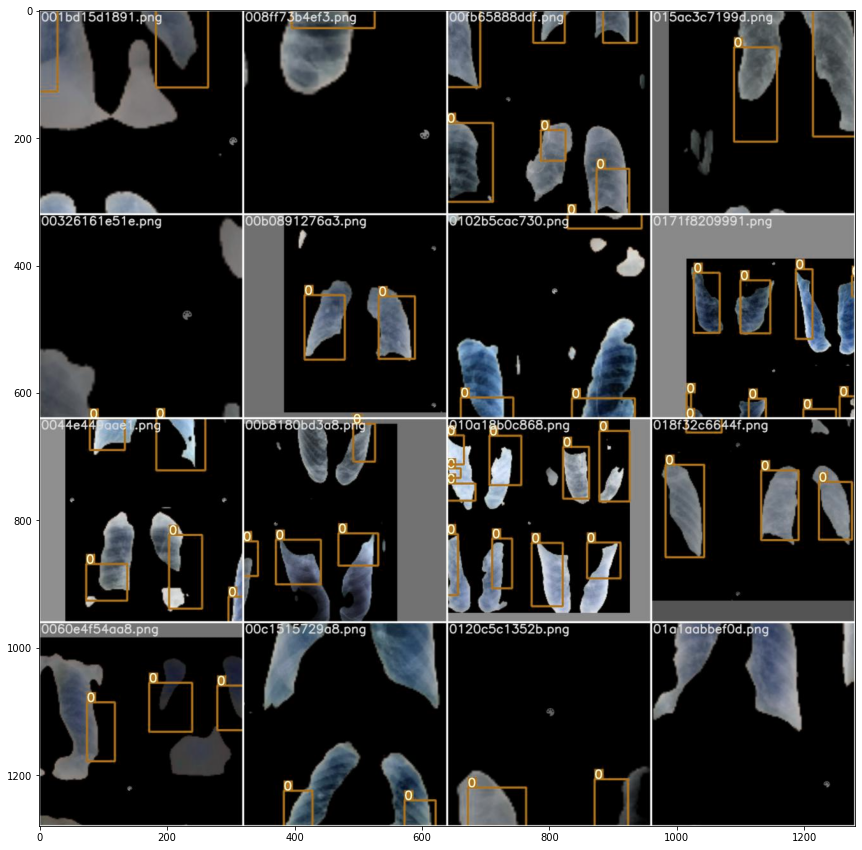

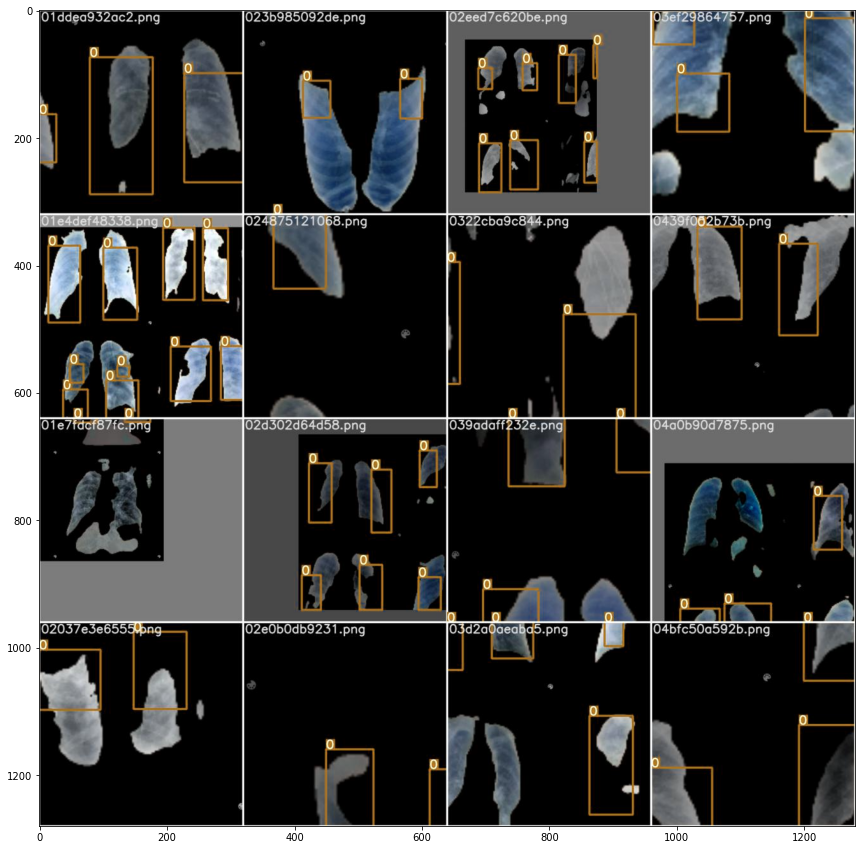

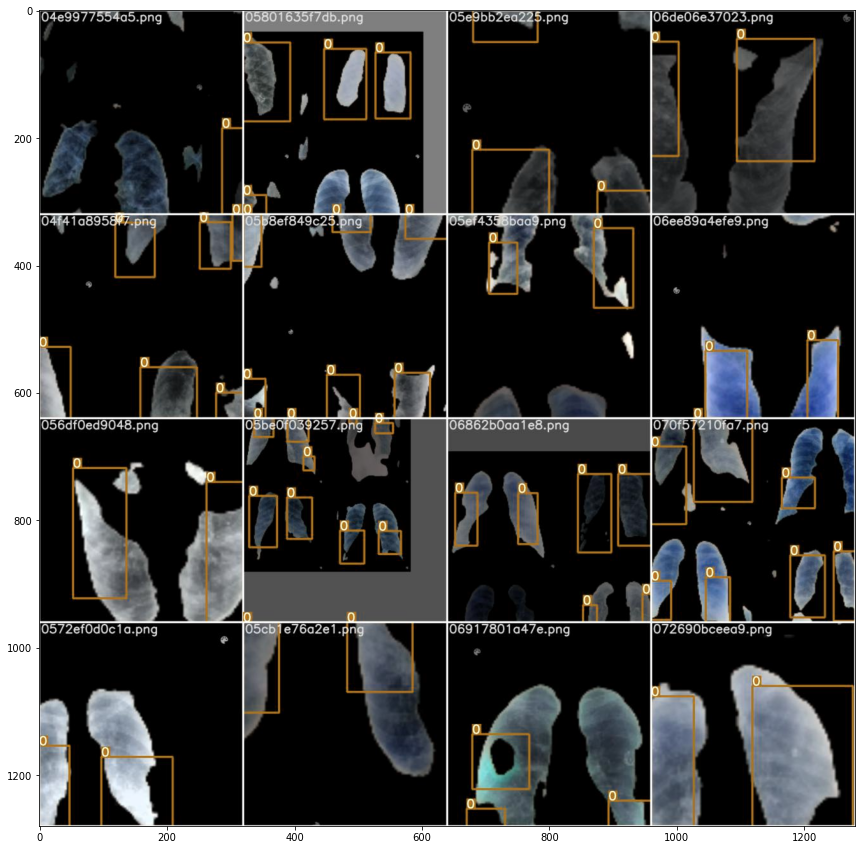

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
img = cv2.imread('runs/train/exp3/train_batch0.jpg')
plt.imshow(img);
cv2.imwrite(save_dir + 'train_batch0.jpg', img)

plt.figure(figsize = (15, 15))
img = cv2.imread('runs/train/exp3/train_batch1.jpg')
plt.imshow(img);
cv2.imwrite(save_dir + 'train_batch1.jpg', img)

plt.figure(figsize = (15, 15))
img = cv2.imread('runs/train/exp3/train_batch2.jpg')
plt.imshow(img);
cv2.imwrite(save_dir + 'train_batch2.jpg', img)

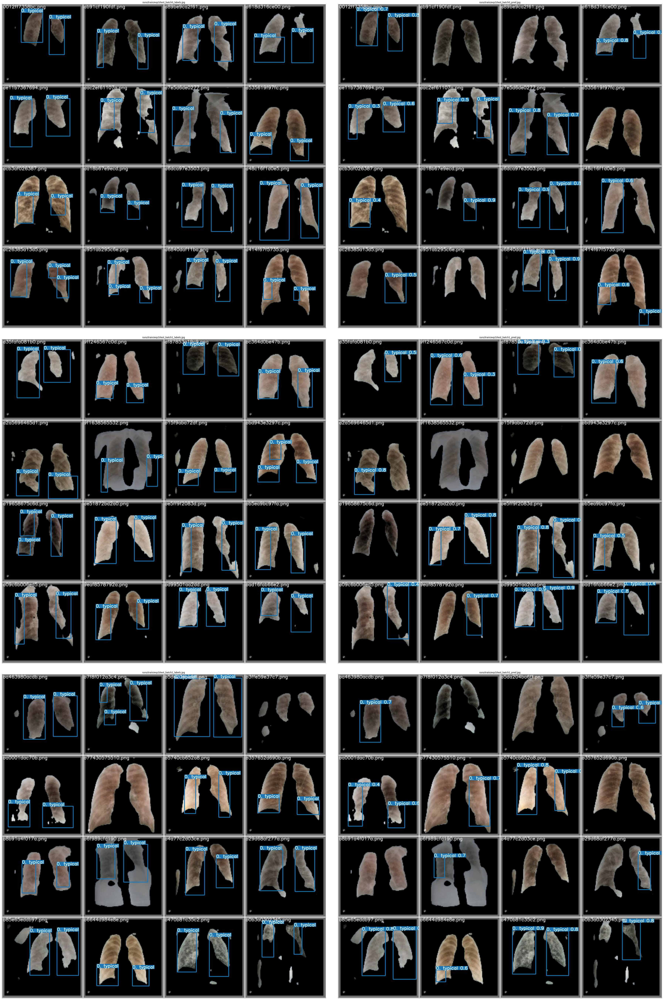

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*25,3*25), constrained_layout = True)
for row in range(3):
    img = cv2.imread(f'runs/train/exp3/test_batch{row}_labels.jpg')
    cv2.imwrite(save_dir + f'test_batch{row}_labels.jpg', img)
    ax[row][0].imshow(plt.imread(f'runs/train/exp3/test_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp3/test_batch{row}_labels.jpg', fontsize = 12)
    
    img = cv2.imread(f'runs/train/exp3/test_batch{row}_pred.jpg')
    cv2.imwrite(save_dir + f'test_batch{row}_pred.jpg', img)
    ax[row][1].imshow(plt.imread(f'runs/train/exp3/test_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp3/test_batch{row}_pred.jpg', fontsize = 12)

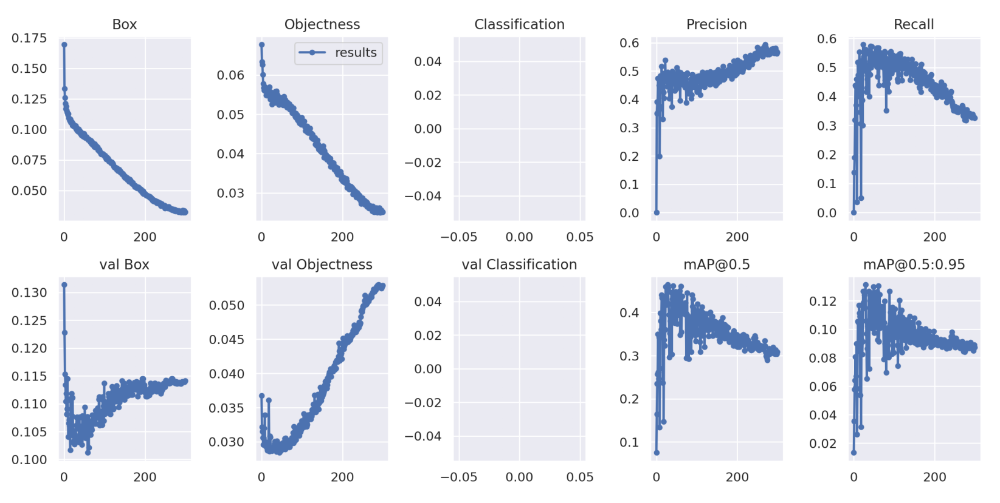

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
img = cv2.imread('runs/train/exp3/results.png')
cv2.imwrite(save_dir + 'results.png', img)
plt.imshow(plt.imread('runs/train/exp3/results.png'));

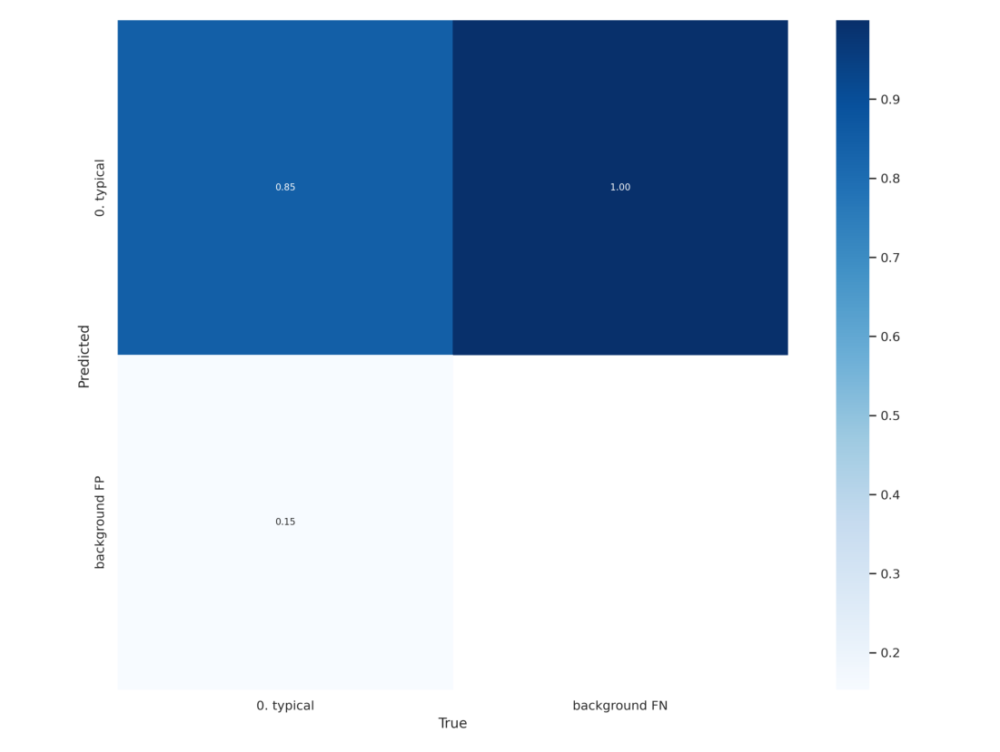

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
img = cv2.imread('runs/train/exp3/confusion_matrix.png')
cv2.imwrite(save_dir + 'confusion_matrix.png', img)
plt.imshow(plt.imread('runs/train/exp3/confusion_matrix.png'));

In [ ]:
!python detect.py --weights 'runs/train/exp3/weights/best.pt' --img 512 --conf 0.1 --iou 0.5 --source /content/covid/siim-cov19/images/val --exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.1, device='', exist_ok=True, img_size=512, iou_thres=0.5, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/covid/siim-cov19/images/val', update=False, view_img=False, weights=['runs/train/exp3/weights/best.pt'])
Using torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 484 layers, 88390614 parameters, 0 gradients, 219.8 GFLOPS
image 1/400 /content/covid/siim-cov19/images/val/0012ff7358bc.png: 512x512 2 0. typicals, Done. (0.035s)
image 2/400

# **Inference**

In [ ]:
# print(os.listdir('runs/train/exp22'))
# for file in os.listdir('runs/train/exp22'):
#     try:
#         shutil.copy('runs/train/exp22/' + file, save_dir)
#     except:
#         continue

# for file in os.listdir('runs/train/exp22/weights'):
#     shutil.copy('runs/train/exp22/weights/' + file, save_dir)
shutil.copytree('runs', save_dir + 'runs_segmentation_typical_300epochs')

'/content/drive/MyDrive/Covid_finalruns_segmentation_typical_300epochs'

400


100%|██████████| 16/16 [00:00<00:00, 166.49it/s]


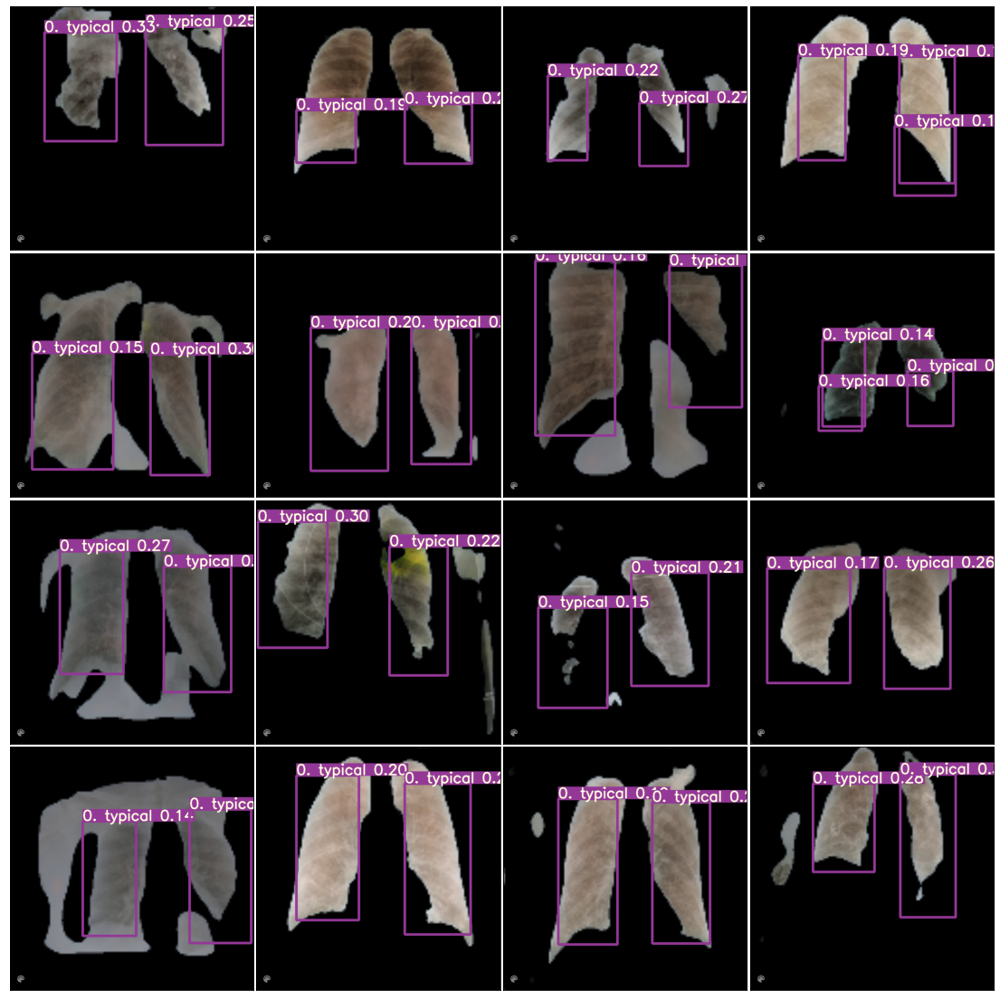

100%|██████████| 16/16 [00:00<00:00, 141.90it/s]


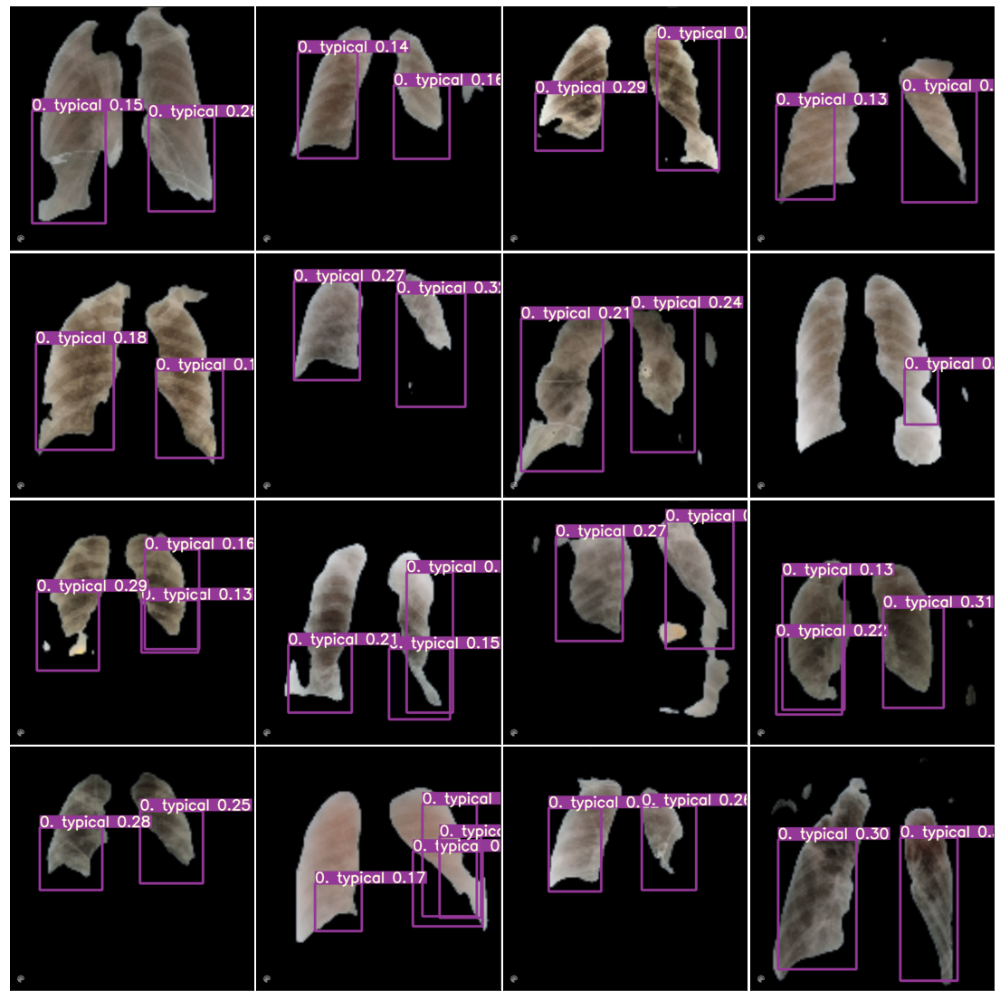

100%|██████████| 16/16 [00:00<00:00, 122.08it/s]


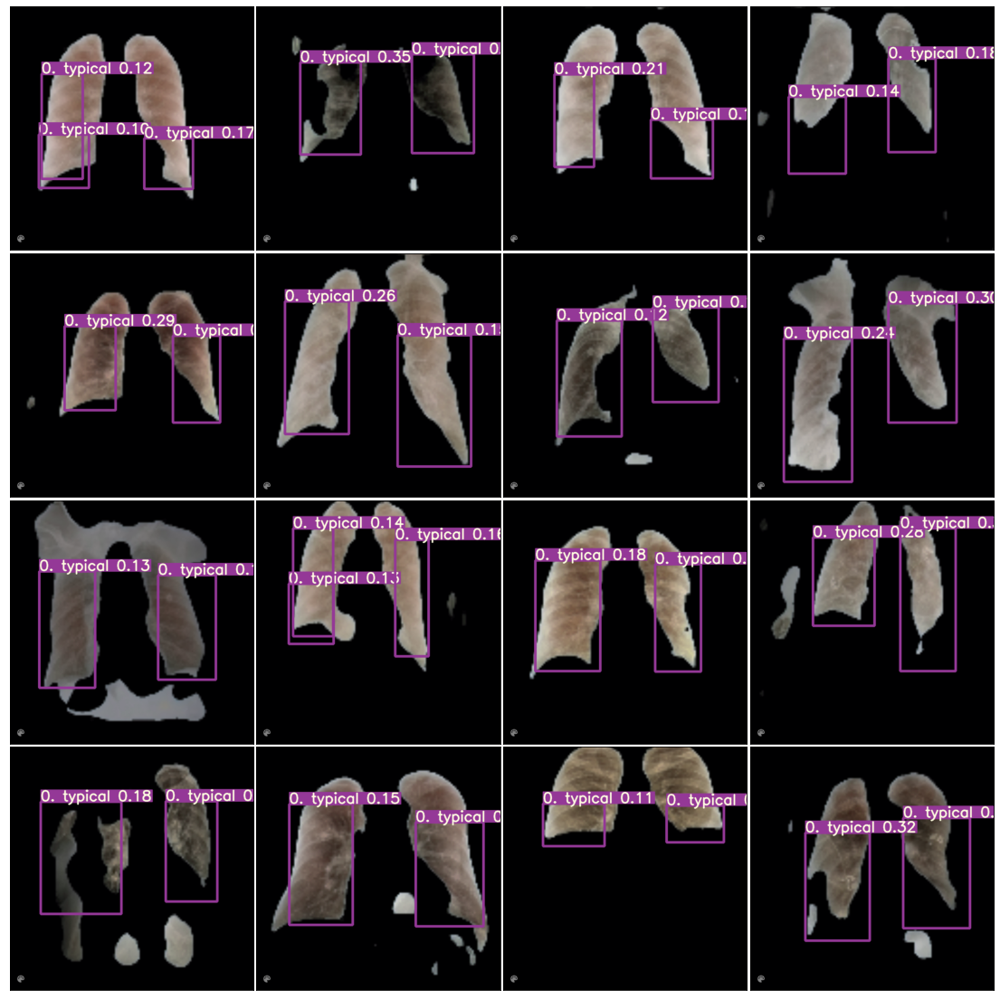

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*')
print(len(files))
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()